In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Dense, Flatten, BatchNormalization, LeakyReLU, Dropout, Reshape

In [2]:
def preprocess_data():
    (X_train, y_train), (_ ,_) = tf.keras.datasets.fashion_mnist.load_data()
    X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1)
    
    X_train = (X_train - 127.5) / 127.5
    buffer_size = X_train.shape[0]
    batch_size = 256
    X_train = tf.data.Dataset.from_tensor_slices(X_train).shuffle(buffer_size).batch(batch_size)
    
    return X_train, batch_size

In [3]:
def build_generator(noise_dim):
    model = Sequential()
    model.add(Dense(7*7*256, use_bias = False, input_shape = (noise_dim, )))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    
    model.add(Reshape((7, 7, 256)))
    
    model.add(Conv2DTranspose(128, (5, 5), padding = "same", use_bias = False))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    
    model.add(Conv2DTranspose(64, (5, 5), strides = (2, 2), padding = "same", use_bias = False))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    
    model.add(Conv2DTranspose(1, (5, 5), strides = (2, 2), padding = "same", use_bias = False, activation = "tanh"))
    return model

def build_discriminator():
    model = Sequential()
    
    model.add(Conv2D(64, (5, 5), strides = (2, 2), padding = "same", input_shape = [28, 28, 1]))
    model.add(LeakyReLU())
    model.add(Dropout(0.3))
    
    model.add(Conv2D(128, (5, 5), strides = (2, 2), padding = "same"))
    model.add(LeakyReLU())
    model.add(Dropout(0.3))
    
    model.add(Flatten())
    model.add(Dense(1))
    return model

In [4]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)
gradient_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001)

def discriminator_loss(expected_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(expected_output), expected_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

@tf.function

def train_steps(images):
    noise = tf.random.normal([batch_size, noise_dim])
    with tf.GradientTape(persistent = True) as gen_tape, tf.GradientTape(persistent = True) as dis_tape:
        generated_images = generator(noise, training = True)
        
        expected_output = discriminator(images, training = True)
        fake_output = discriminator(generated_images, training = True)
        
        gen_loss = generator_loss(fake_output)
        dis_loss = discriminator_loss(expected_output, fake_output)
    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = gen_tape.gradient(dis_loss, discriminator.trainable_variables)
    
    gradient_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables)) 
    
def train(dataset, epochs, test_images):
    for epoch in range(epochs):
        for image_batch in(dataset):
            train_steps(image_batch)
        print("Epoch: {}".format(epoch + 1))
        generated_images = generator(test_images, training = False)
        fig = plt.figure(figsize = (15, 15))
        for i in range(generated_images.shape[0]):
            plt.subplot(1, 10, i + 1)
            plt.imshow((generated_images[i, :, :, 0] * 127.5) + 127.5, cmap = "gray")
            plt.axis("off")
        plt.show()

Epoch: 1


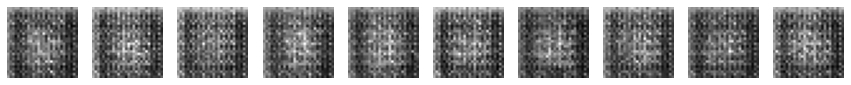

Epoch: 2


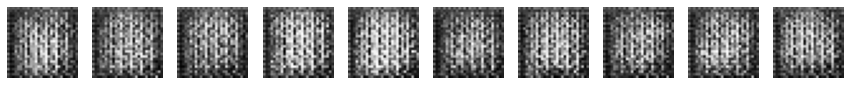

Epoch: 3


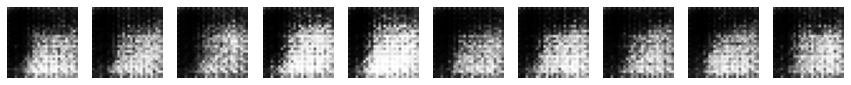

Epoch: 4


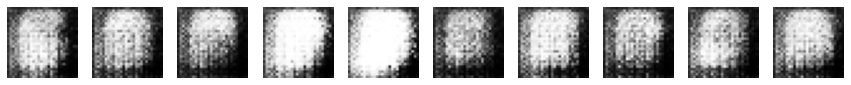

Epoch: 5


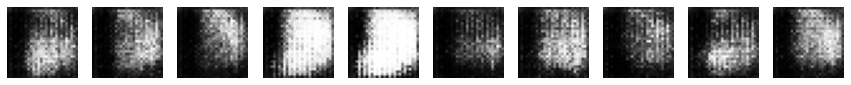

Epoch: 6


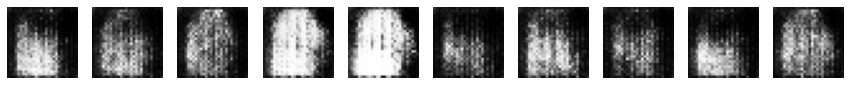

Epoch: 7


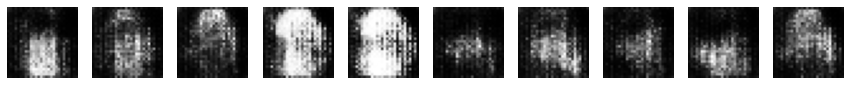

Epoch: 8


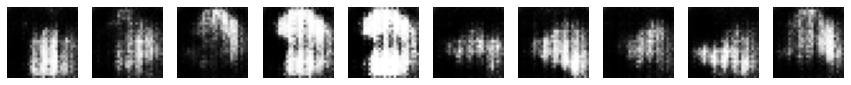

Epoch: 9


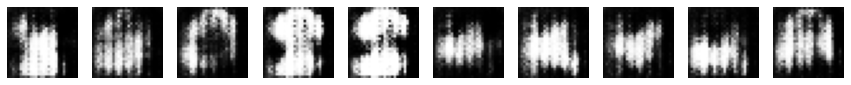

Epoch: 10


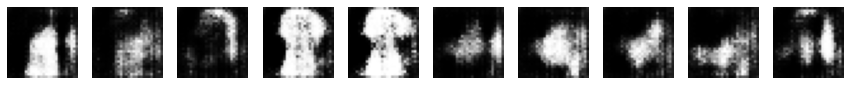

Epoch: 11


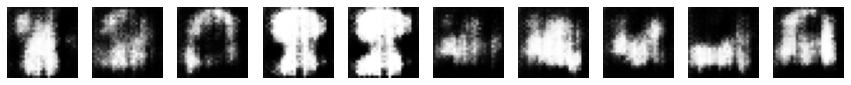

Epoch: 12


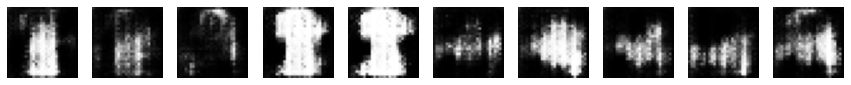

Epoch: 13


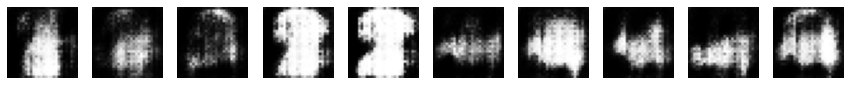

Epoch: 14


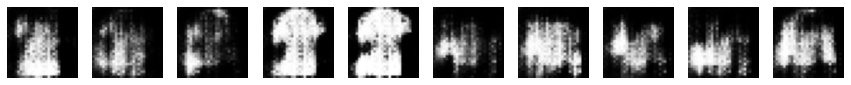

Epoch: 15


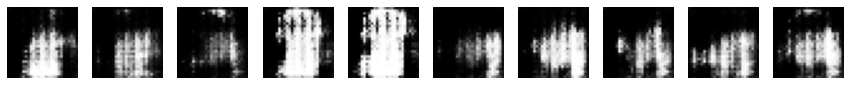

Epoch: 16


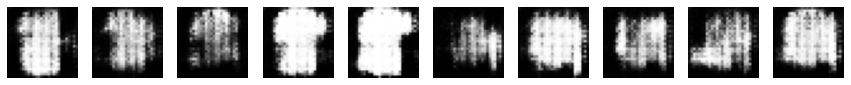

Epoch: 17


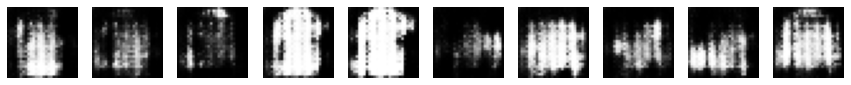

Epoch: 18


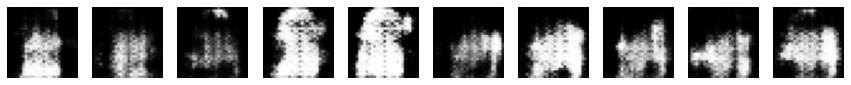

Epoch: 19


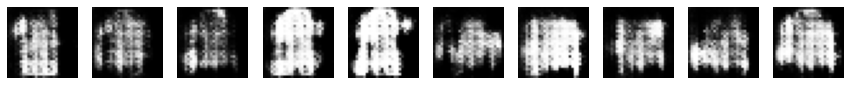

Epoch: 20


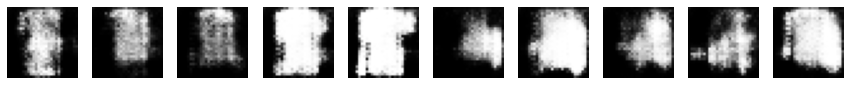

Epoch: 21


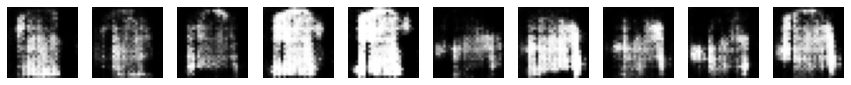

Epoch: 22


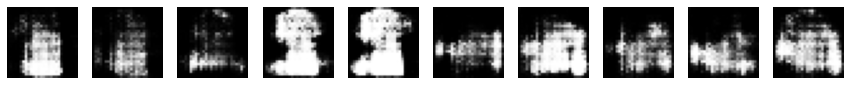

Epoch: 23


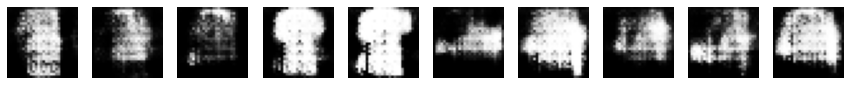

Epoch: 24


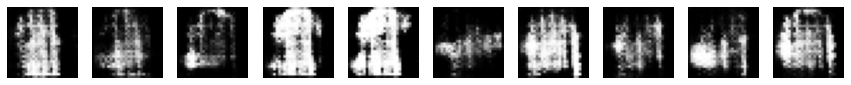

Epoch: 25


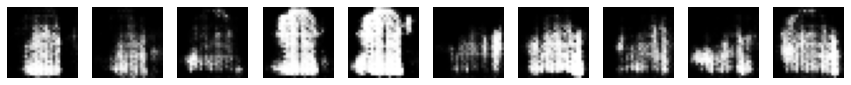

Epoch: 26


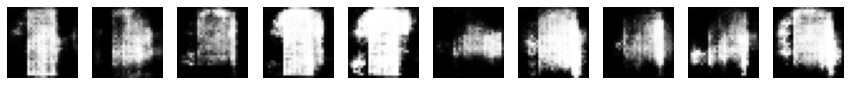

Epoch: 27


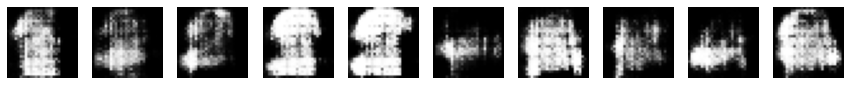

Epoch: 28


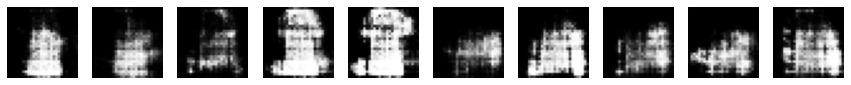

Epoch: 29


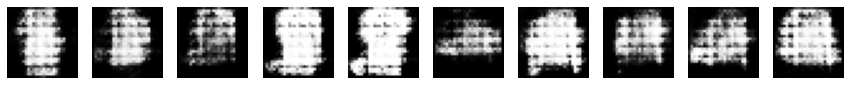

Epoch: 30


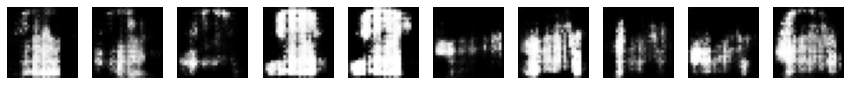

Epoch: 31


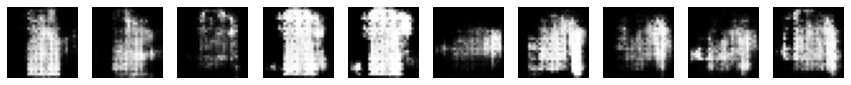

Epoch: 32


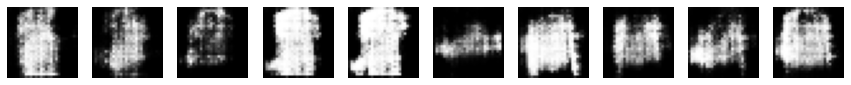

Epoch: 33


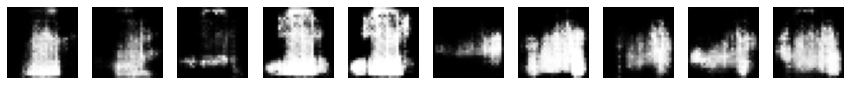

Epoch: 34


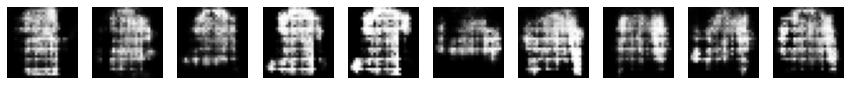

Epoch: 35


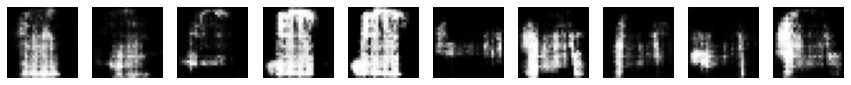

Epoch: 36


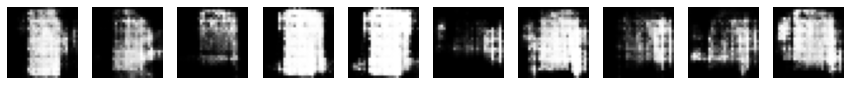

Epoch: 37


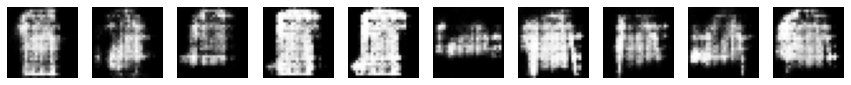

Epoch: 38


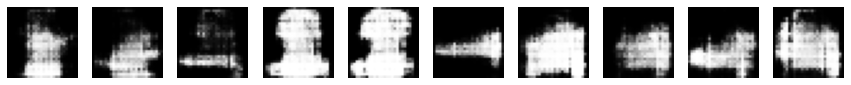

Epoch: 39


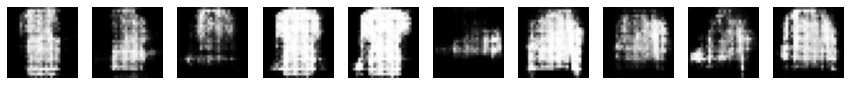

Epoch: 40


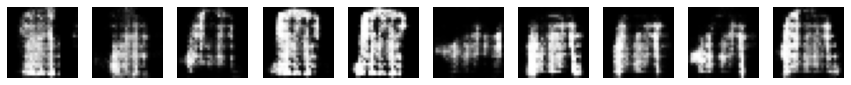

Epoch: 41


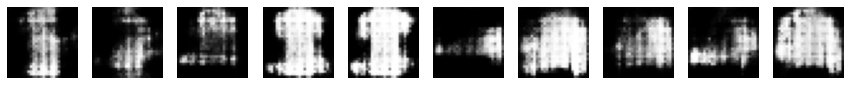

Epoch: 42


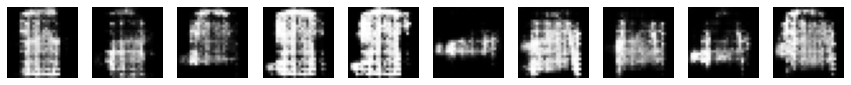

Epoch: 43


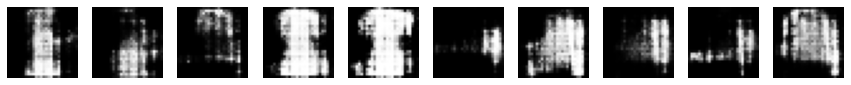

Epoch: 44


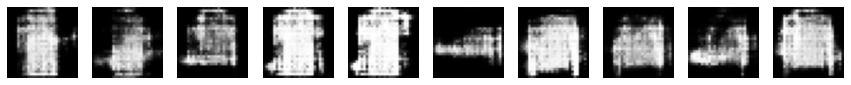

Epoch: 45


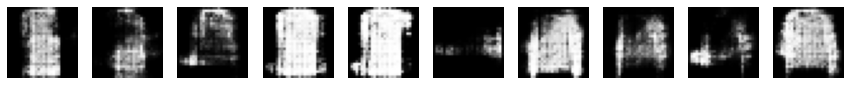

Epoch: 46


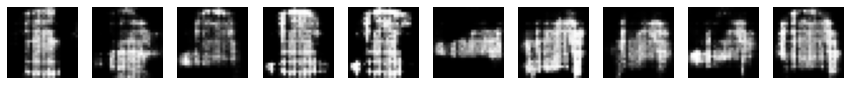

Epoch: 47


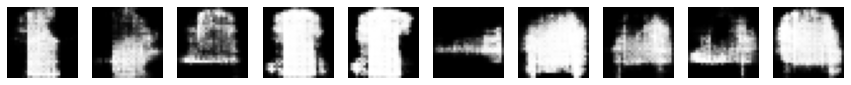

Epoch: 48


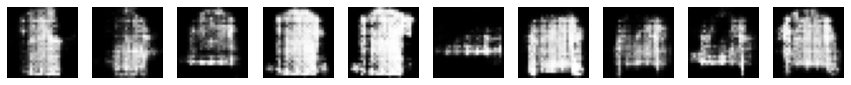

Epoch: 49


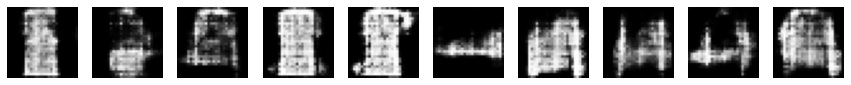

Epoch: 50


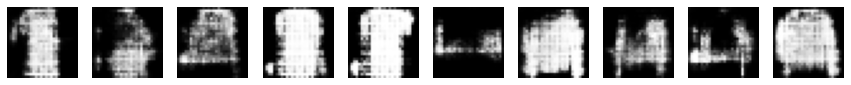

Epoch: 51


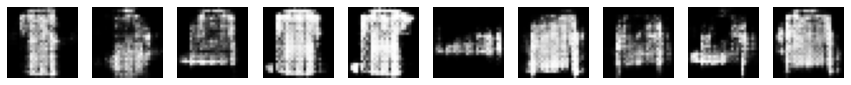

Epoch: 52


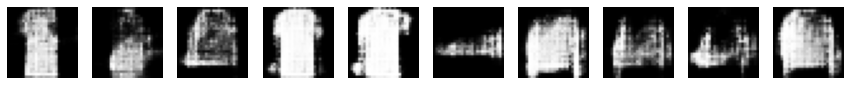

Epoch: 53


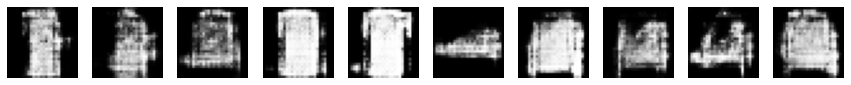

Epoch: 54


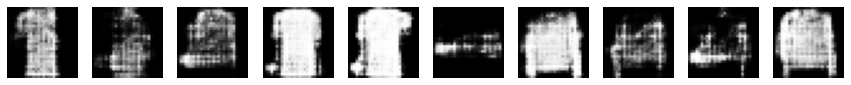

Epoch: 55


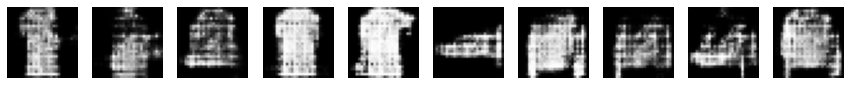

Epoch: 56


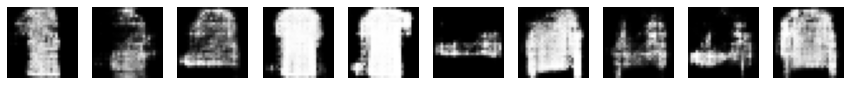

Epoch: 57


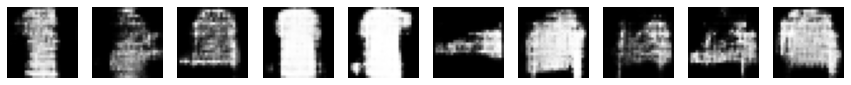

Epoch: 58


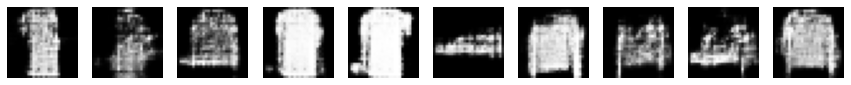

Epoch: 59


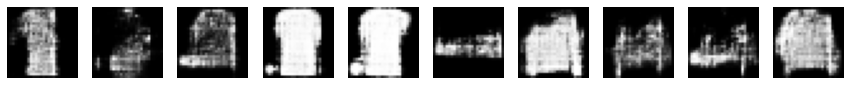

Epoch: 60


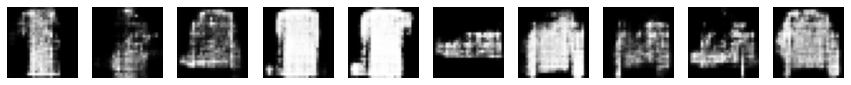

Epoch: 61


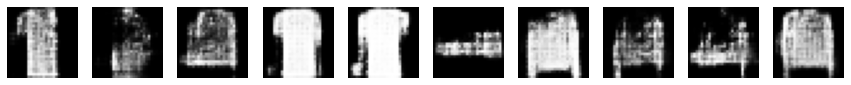

Epoch: 62


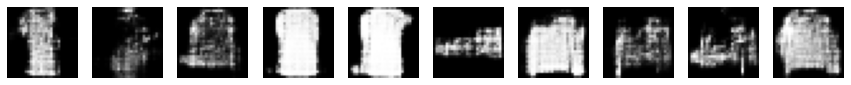

Epoch: 63


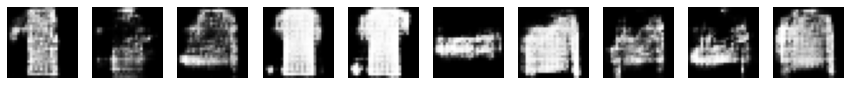

Epoch: 64


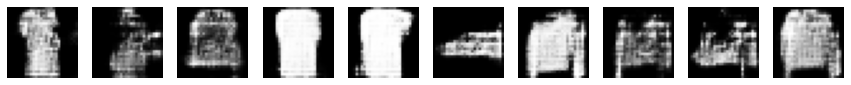

Epoch: 65


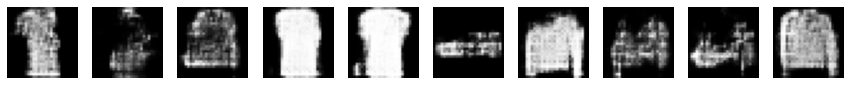

Epoch: 66


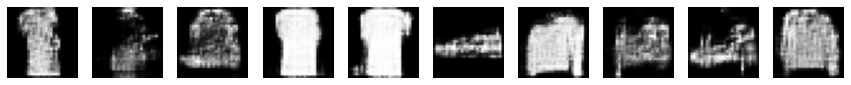

Epoch: 67


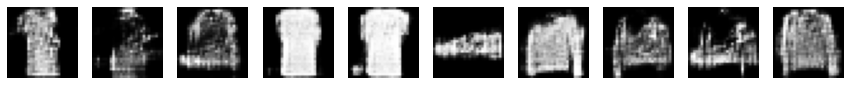

Epoch: 68


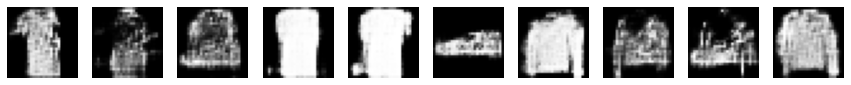

Epoch: 69


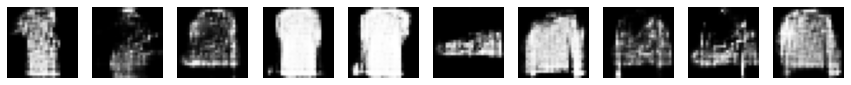

Epoch: 70


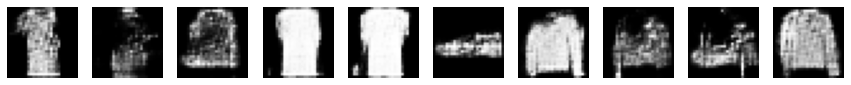

Epoch: 71


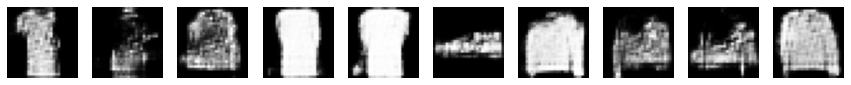

Epoch: 72


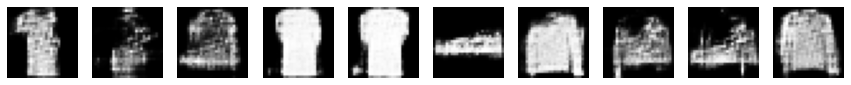

Epoch: 73


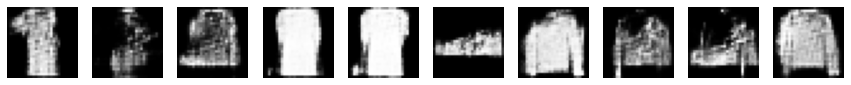

Epoch: 74


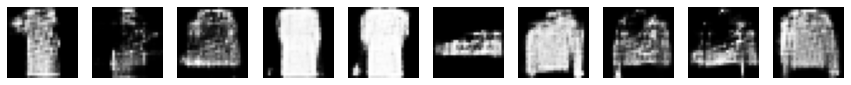

Epoch: 75


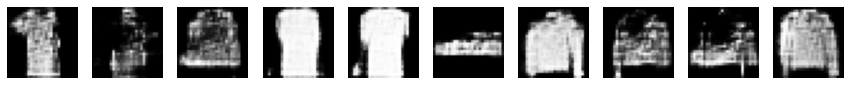

Epoch: 76


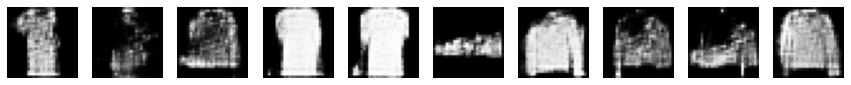

Epoch: 77


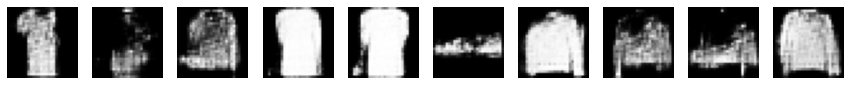

Epoch: 78


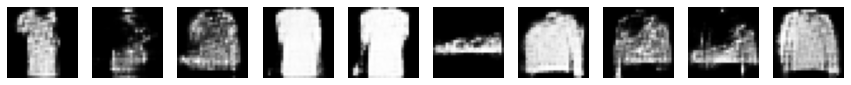

Epoch: 79


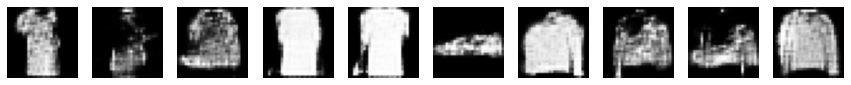

Epoch: 80


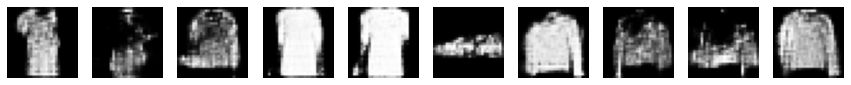

Epoch: 81


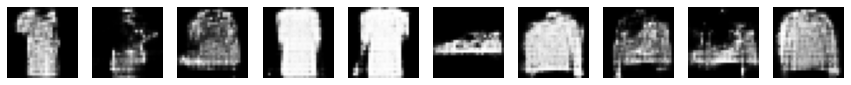

Epoch: 82


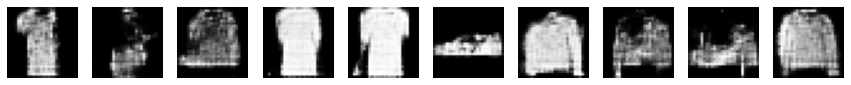

Epoch: 83


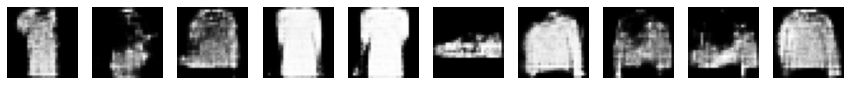

Epoch: 84


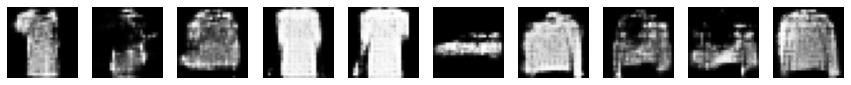

Epoch: 85


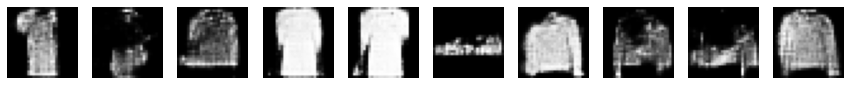

Epoch: 86


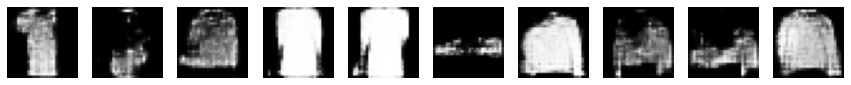

Epoch: 87


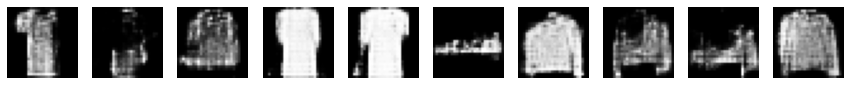

Epoch: 88


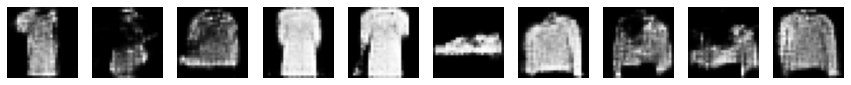

Epoch: 89


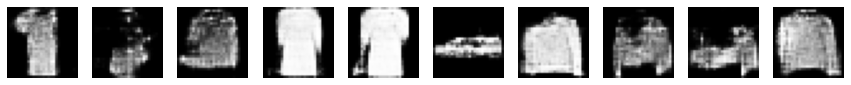

Epoch: 90


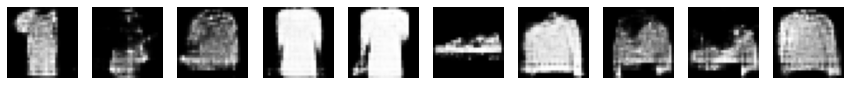

Epoch: 91


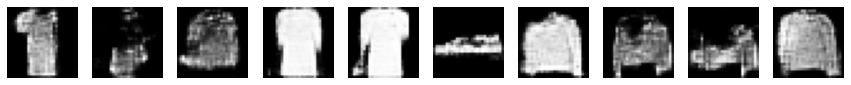

Epoch: 92


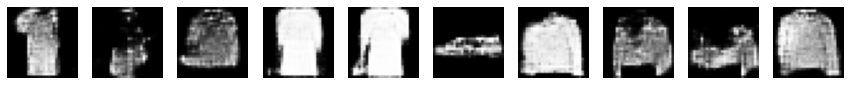

Epoch: 93


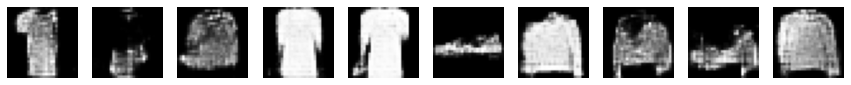

Epoch: 94


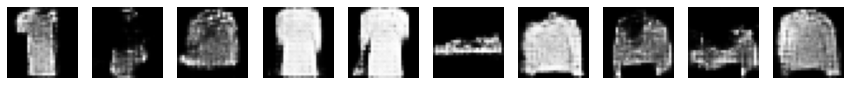

Epoch: 95


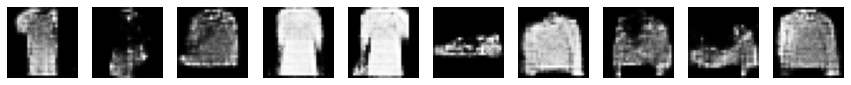

Epoch: 96


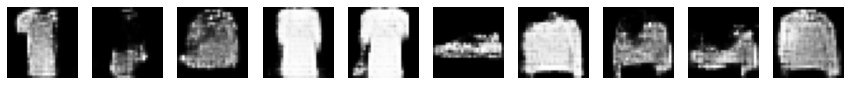

Epoch: 97


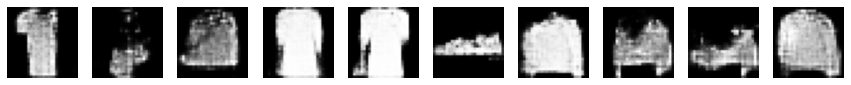

Epoch: 98


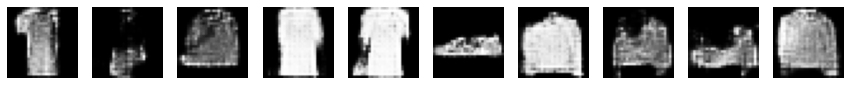

Epoch: 99


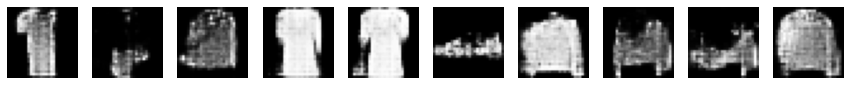

Epoch: 100


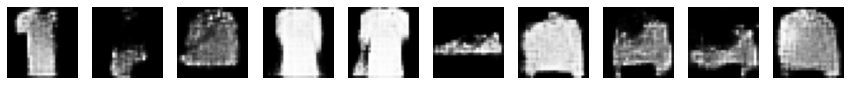

Epoch: 101


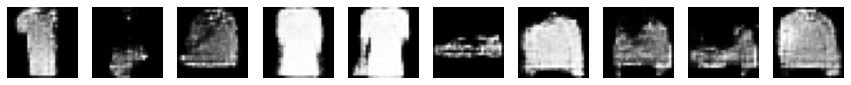

Epoch: 102


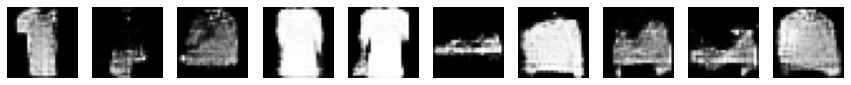

Epoch: 103


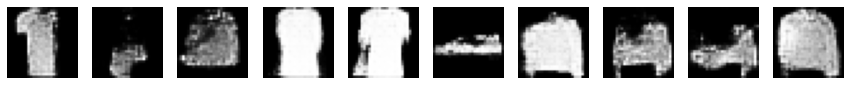

Epoch: 104


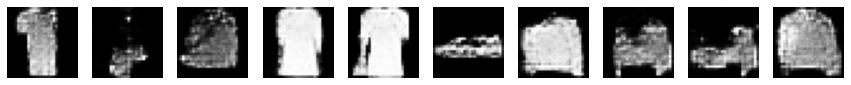

Epoch: 105


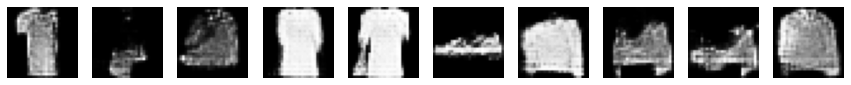

Epoch: 106


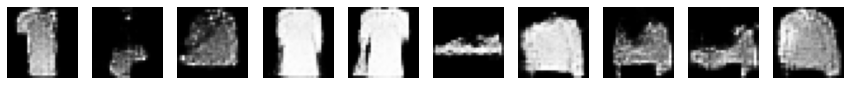

Epoch: 107


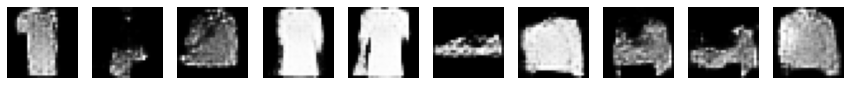

Epoch: 108


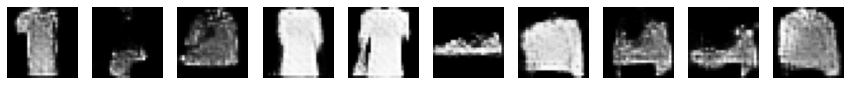

Epoch: 109


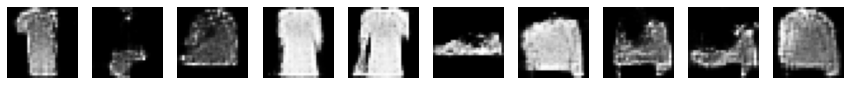

Epoch: 110


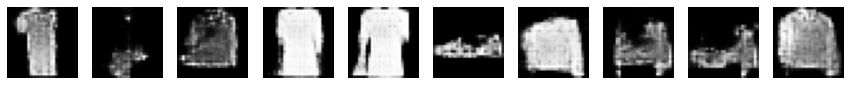

Epoch: 111


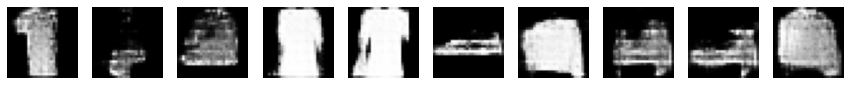

Epoch: 112


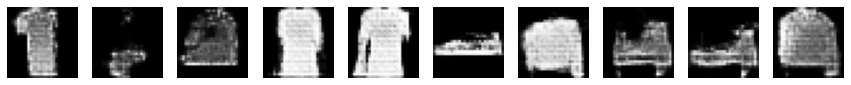

Epoch: 113


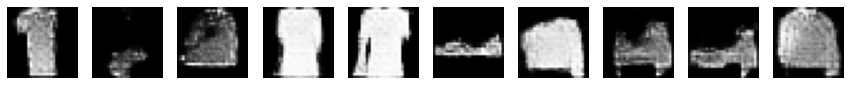

Epoch: 114


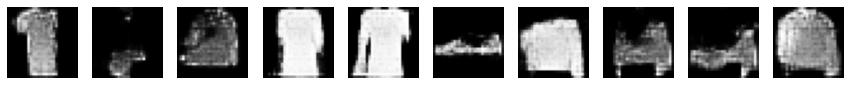

Epoch: 115


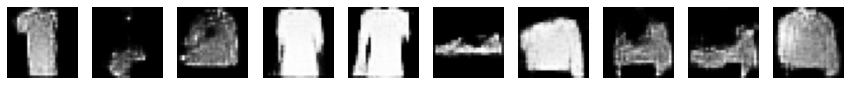

Epoch: 116


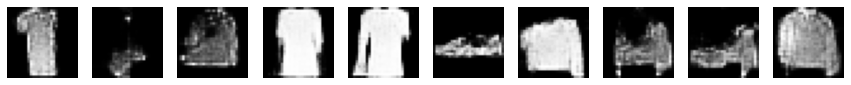

Epoch: 117


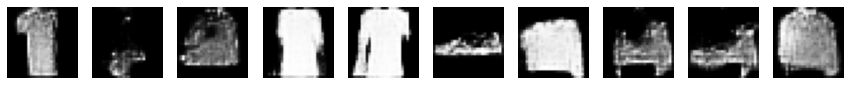

Epoch: 118


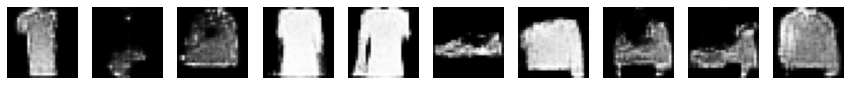

Epoch: 119


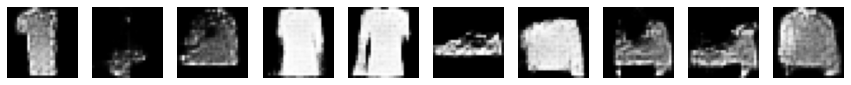

Epoch: 120


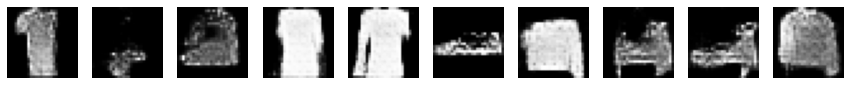

Epoch: 121


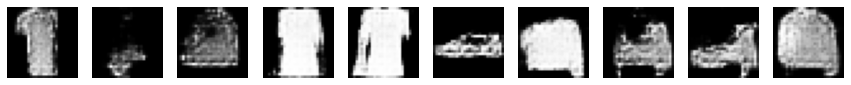

Epoch: 122


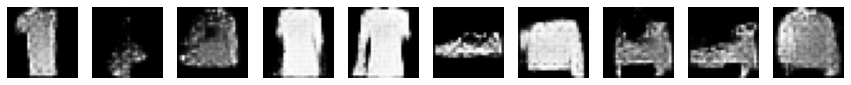

Epoch: 123


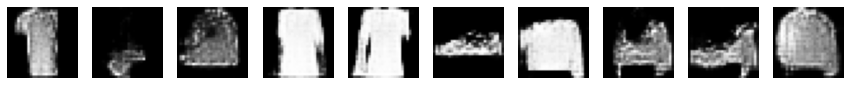

Epoch: 124


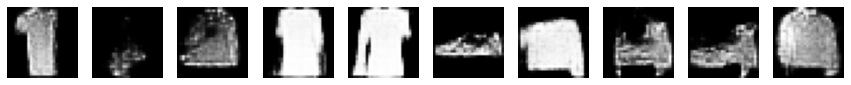

Epoch: 125


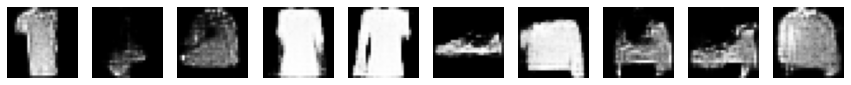

Epoch: 126


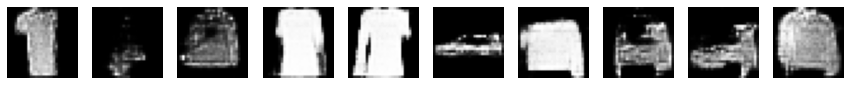

Epoch: 127


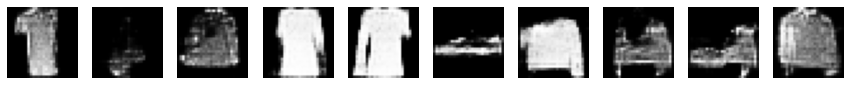

Epoch: 128


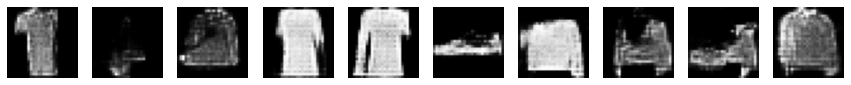

Epoch: 129


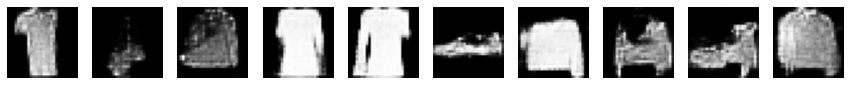

Epoch: 130


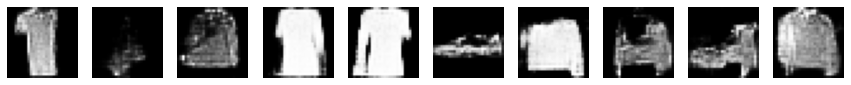

Epoch: 131


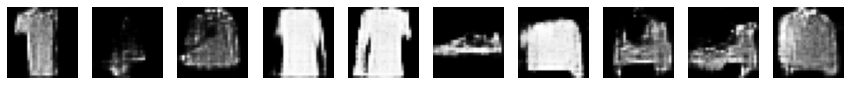

Epoch: 132


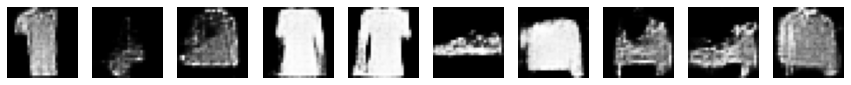

Epoch: 133


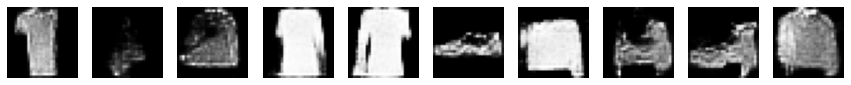

Epoch: 134


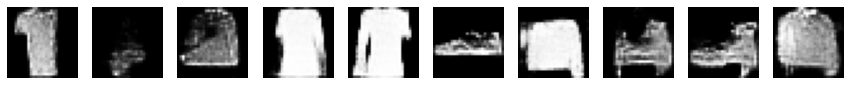

Epoch: 135


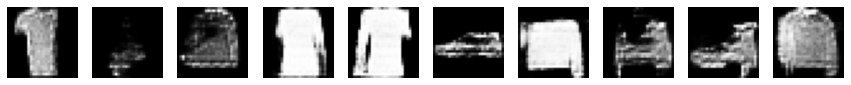

Epoch: 136


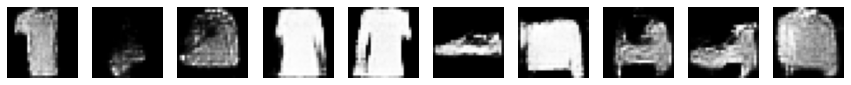

Epoch: 137


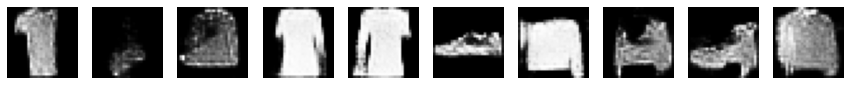

Epoch: 138


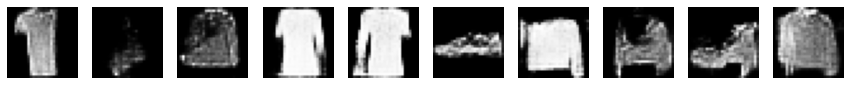

Epoch: 139


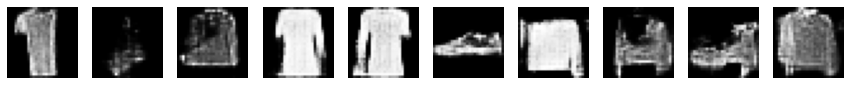

Epoch: 140


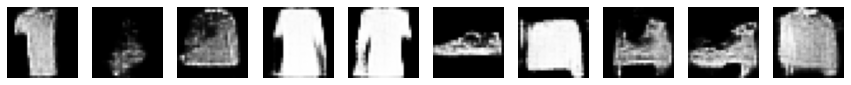

Epoch: 141


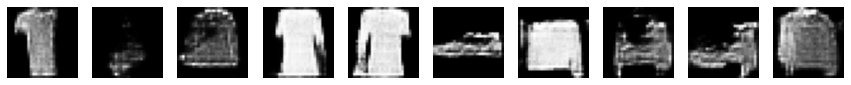

Epoch: 142


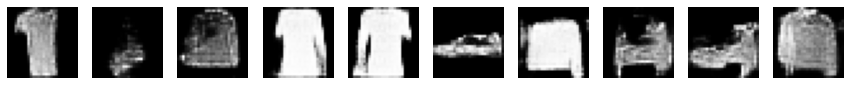

Epoch: 143


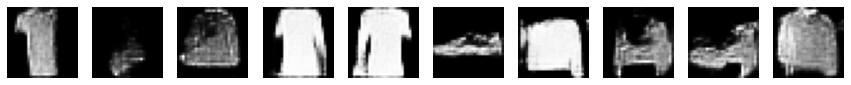

Epoch: 144


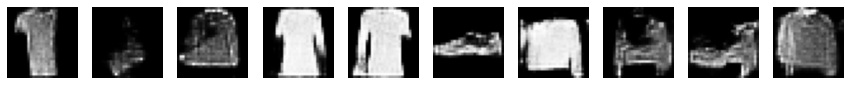

Epoch: 145


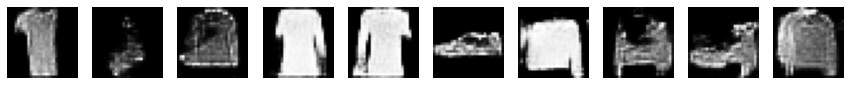

Epoch: 146


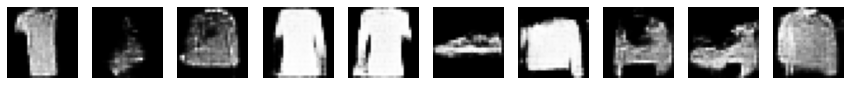

Epoch: 147


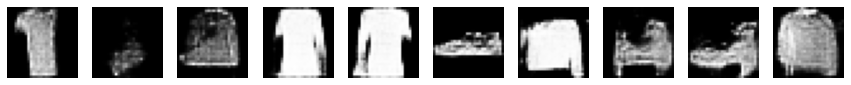

Epoch: 148


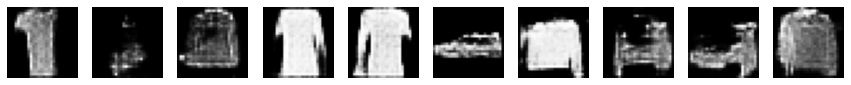

Epoch: 149


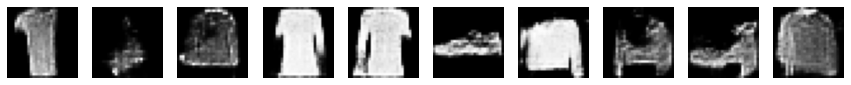

Epoch: 150


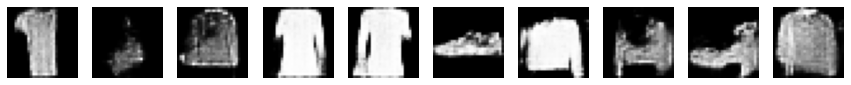

Epoch: 151


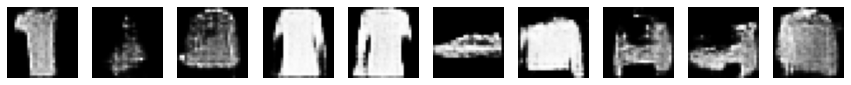

Epoch: 152


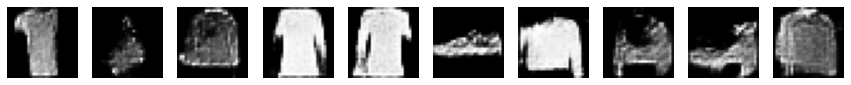

Epoch: 153


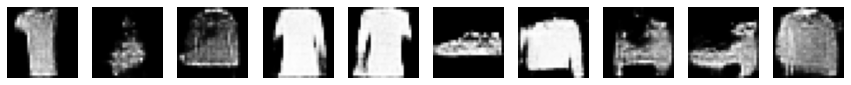

Epoch: 154


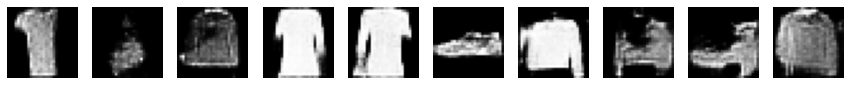

Epoch: 155


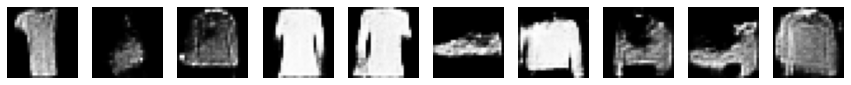

Epoch: 156


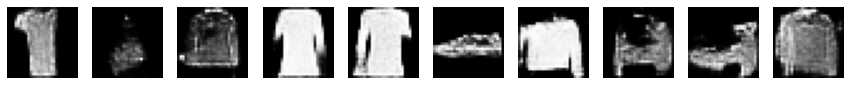

Epoch: 157


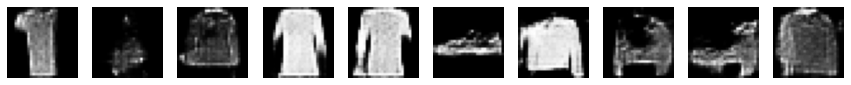

Epoch: 158


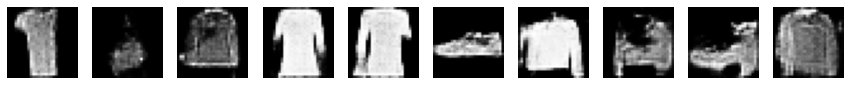

Epoch: 159


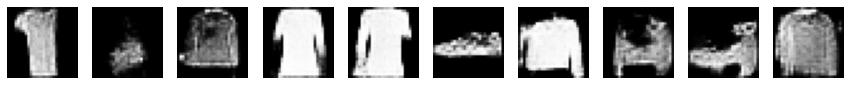

Epoch: 160


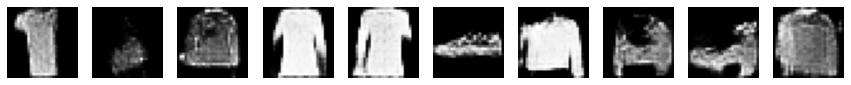

Epoch: 161


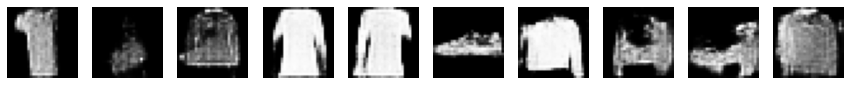

Epoch: 162


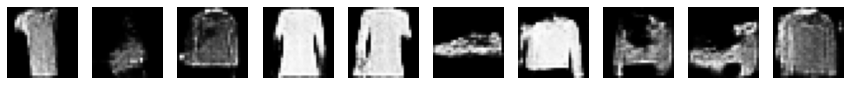

Epoch: 163


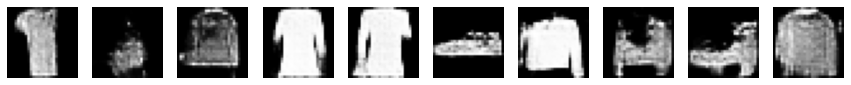

Epoch: 164


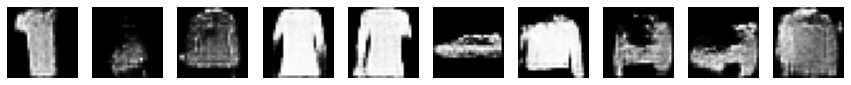

Epoch: 165


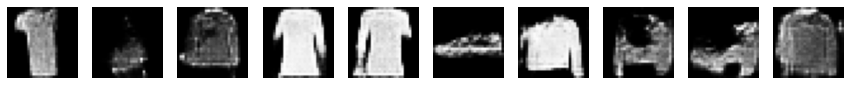

Epoch: 166


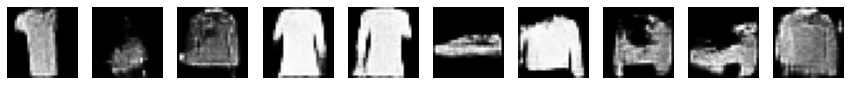

Epoch: 167


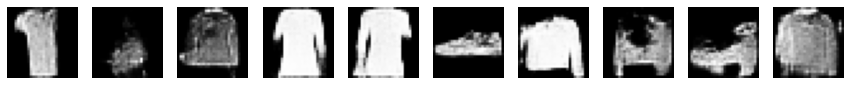

Epoch: 168


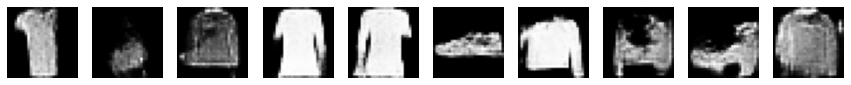

Epoch: 169


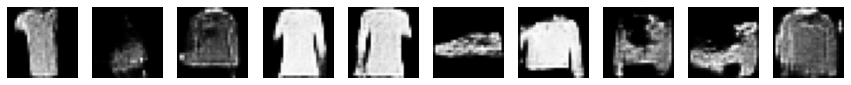

Epoch: 170


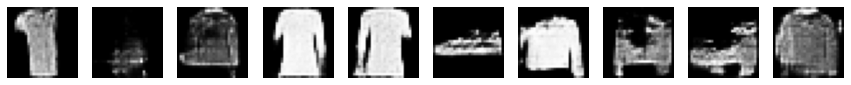

Epoch: 171


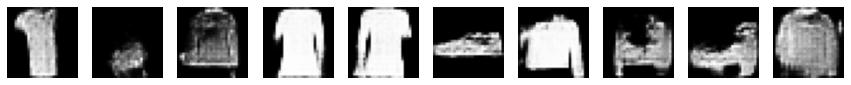

Epoch: 172


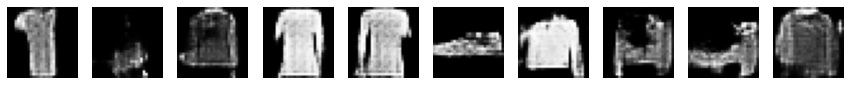

Epoch: 173


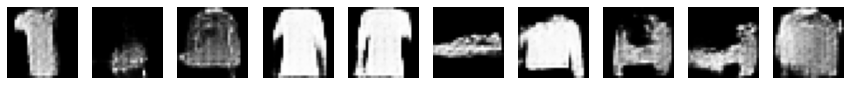

Epoch: 174


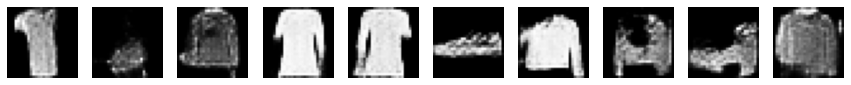

Epoch: 175


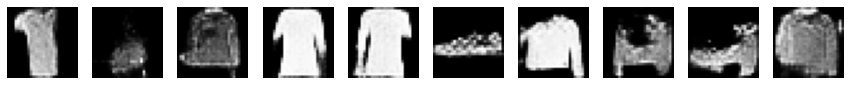

Epoch: 176


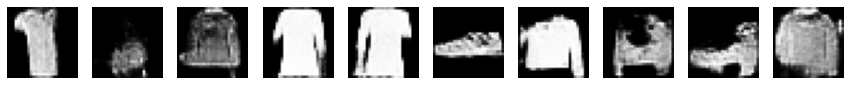

Epoch: 177


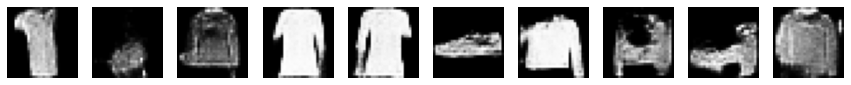

Epoch: 178


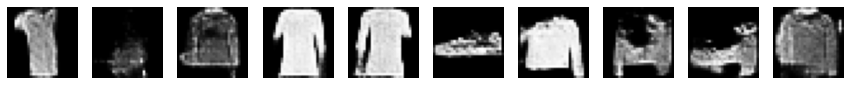

Epoch: 179


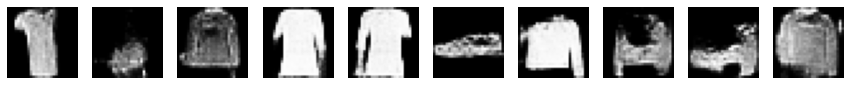

Epoch: 180


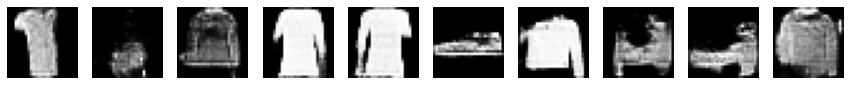

Epoch: 181


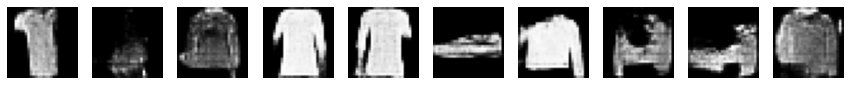

Epoch: 182


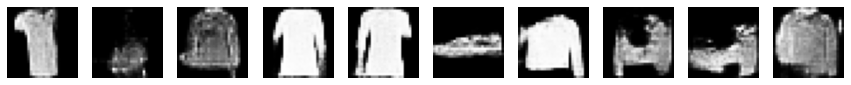

Epoch: 183


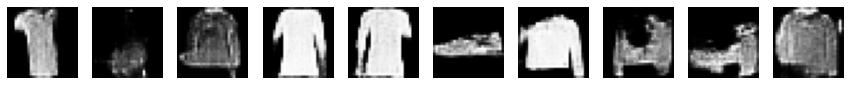

Epoch: 184


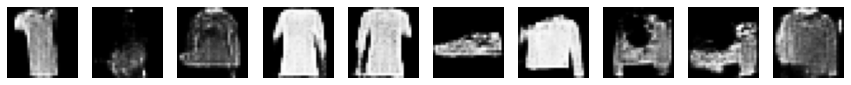

Epoch: 185


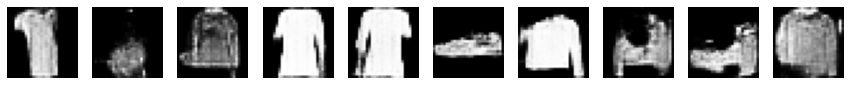

Epoch: 186


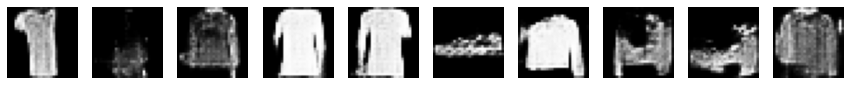

Epoch: 187


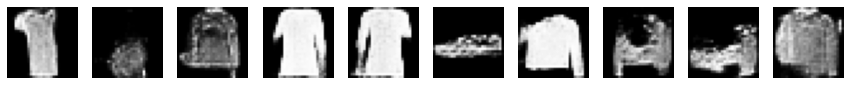

Epoch: 188


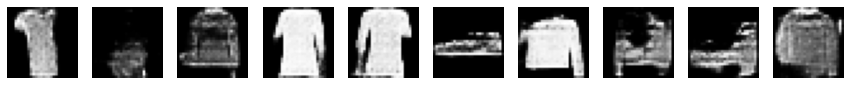

Epoch: 189


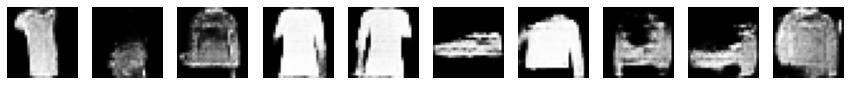

Epoch: 190


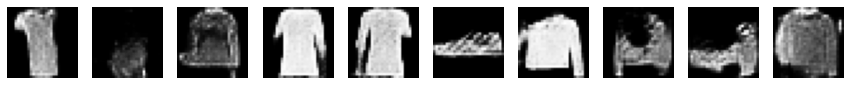

Epoch: 191


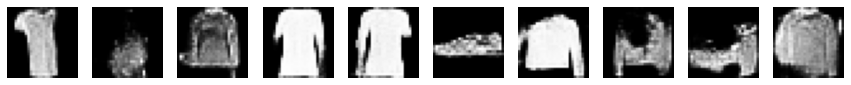

Epoch: 192


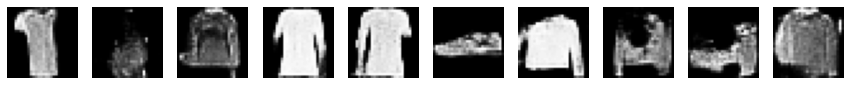

Epoch: 193


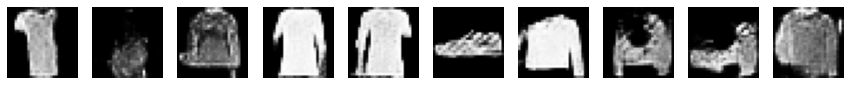

Epoch: 194


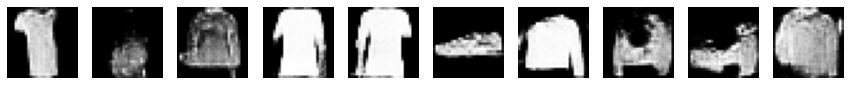

Epoch: 195


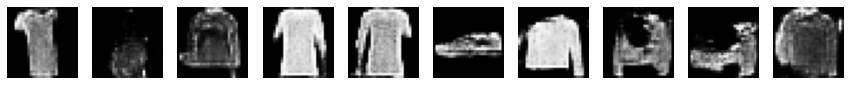

Epoch: 196


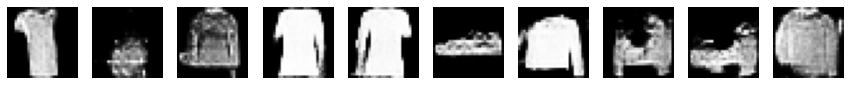

Epoch: 197


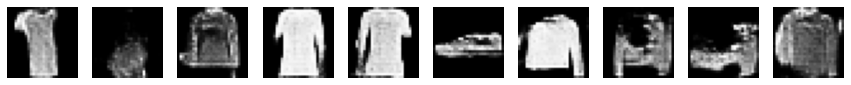

Epoch: 198


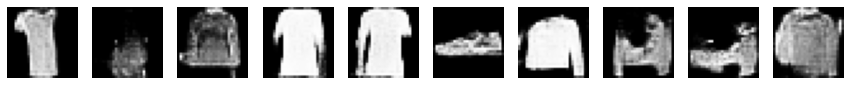

Epoch: 199


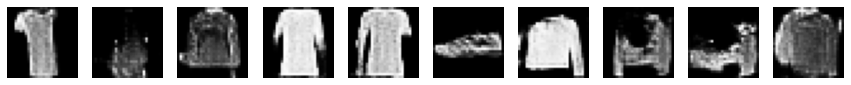

Epoch: 200


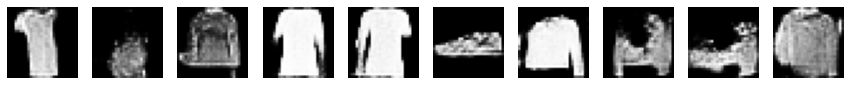

In [6]:
X_train, batch_size = preprocess_data()
noise_dim = 100
num_generated_img = 10
generator = build_generator(noise_dim)
discriminator = build_discriminator()
train(X_train, epochs = 200, test_images = tf.random.normal([num_generated_img, noise_dim]))

In [8]:
tf.keras.backend.clear_session()